| **Chapter**                   | 7:  Spatial dynamics of epidemics |
| --- | --- |
| **Computational Note**        | 7.x: Moran's I of COVID-19 cases |
| **Package prerequisites**     | [Pysal](https://pysal.org), [splot](https://splot.readthedocs.io/en/latest/), [contextily](https://contextily.readthedocs.io/en/latest/) | 


# Moran's I of COVID-19 cases

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import pandas as pd
from pysal.explore import esda
from splot import esda as esdaplot
from pysal.lib import weights
import contextily


COLORS = {"S": "#2f4b7c",
          "E": "#ffa600",
          "I": "#f95d6a",
          "R": "#a05195",
          "D": "#003f5c",
          "C": "#ff7c43",
          "X": "#665191",
          "Y": "#d45087"}

/Users/csefalvayk/miniconda3/envs/computational-infectious-disease/lib/python3.10/site-packages/spaghetti/network.py:36: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(f"{dep_msg}", FutureWarning)


In [2]:
%load_ext watermark
%watermark --iversions -v -a "Chris von Csefalvay" -gu "chrisvoncsefalvay"

Author: Chris von Csefalvay

Github username: chrisvoncsefalvay

Python implementation: CPython
Python version       : 3.10.2
IPython version      : 8.4.0

seaborn   : 0.11.2
geopandas : 0.10.2
splot     : 1.1.5.post1
contextily: 1.2.0
libpysal  : 4.6.2
esda      : 2.4.1
pandas    : 1.4.2
matplotlib: 3.5.2



In [3]:
TARGET_CRS: int = 2163
OUTPUT_DPI: int = 600
BASEMAP = contextily.providers.Stamen.TonerLite

In [4]:
county_data = pd.read_csv("https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-counties-recent.csv",
                          usecols=["date", "fips", "state", "cases"],
                          dtype={"date": str, "fips": str, "state": str, "cases": int})

In [5]:
county_data = county_data[~county_data.state.isin(["Alaska", 
                                     "American Samoa", 
                                     "Guam",
                                     "Hawaii",
                                     "Northern Mariana Islands",
                                     "Puerto Rico",
                                     "Virgin Islands"])]

In [6]:
county_data = county_data[county_data.date == county_data.date.unique().max()]

In [7]:
county_data.date.unique().max()

'2022-06-19'

In [8]:
populations = pd.read_csv("https://www2.census.gov/programs-surveys/popest/datasets/2010-2019/counties/totals/co-est2019-alldata.csv", engine="python", 
                          encoding="latin1",
                          usecols=["SUMLEV", "STATE", "COUNTY", "POPESTIMATE2019"])

In [9]:
populations = populations[populations.SUMLEV == 50]

In [10]:
populations["FIPS"] = [f"{state:02}{county:03}" for state, county in zip(populations.STATE, populations.COUNTY)]

In [11]:
populations.index = populations.FIPS
county_data.index = county_data.fips

In [12]:
county_data = county_data.join(populations[["POPESTIMATE2019"]])

In [13]:
county_data["cases_per_100k"] = county_data.cases / (county_data.POPESTIMATE2019 / 100000)

In [14]:
!wget https://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_050_00_500k.json

compinit:527: no such file or directory: /usr/local/share/zsh/site-functions/_brew_cask
--2022-06-20 19:27:04--  https://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_050_00_500k.json
Resolving eric.clst.org (eric.clst.org)... 69.163.226.135
Connecting to eric.clst.org (eric.clst.org)|69.163.226.135|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 23543838 (22M) [application/json]
Saving to: ‘gz_2010_us_050_00_500k.json’

gz_2010_us_050_00_5 100%[===================>]  22.45M  2.59MB/s    in 6.4s    

2022-06-20 19:27:11 (3.49 MB/s) - ‘gz_2010_us_050_00_500k.json’ saved [23543838/23543838]



In [15]:
county_geo = gpd.read_file("https://gist.githubusercontent.com/sdwfrost/d1c73f91dd9d175998ed166eb216994a/raw/e89c35f308cee7e2e5a784e1d3afc5d449e9e4bb/counties.geojson")

In [16]:
county_geo = county_geo.to_crs(epsg=TARGET_CRS)

In [17]:
county_geo.index = county_geo.GEOID

In [18]:
gdf = gpd.GeoDataFrame(county_geo.join(county_data.cases_per_100k), crs=county_geo.crs)

In [19]:
gdf = gdf.dropna()

In [20]:
w = weights.distance.KNN.from_dataframe(gdf, k=8)

In [21]:
# Row standardisation

w.transform = "R"

In [22]:
gdf["w_cases_per_100k"] = weights.spatial_lag.lag_spatial(w, gdf["cases_per_100k"])

In [23]:
gdf["cases_per_100k_std"] = (gdf["cases_per_100k"] - gdf["cases_per_100k"].mean())
gdf["w_cases_per_100k_std"] = (gdf["w_cases_per_100k"] - gdf["cases_per_100k"].mean())

In [24]:
morans_i = esda.moran.Moran_Local(gdf["cases_per_100k"], w)

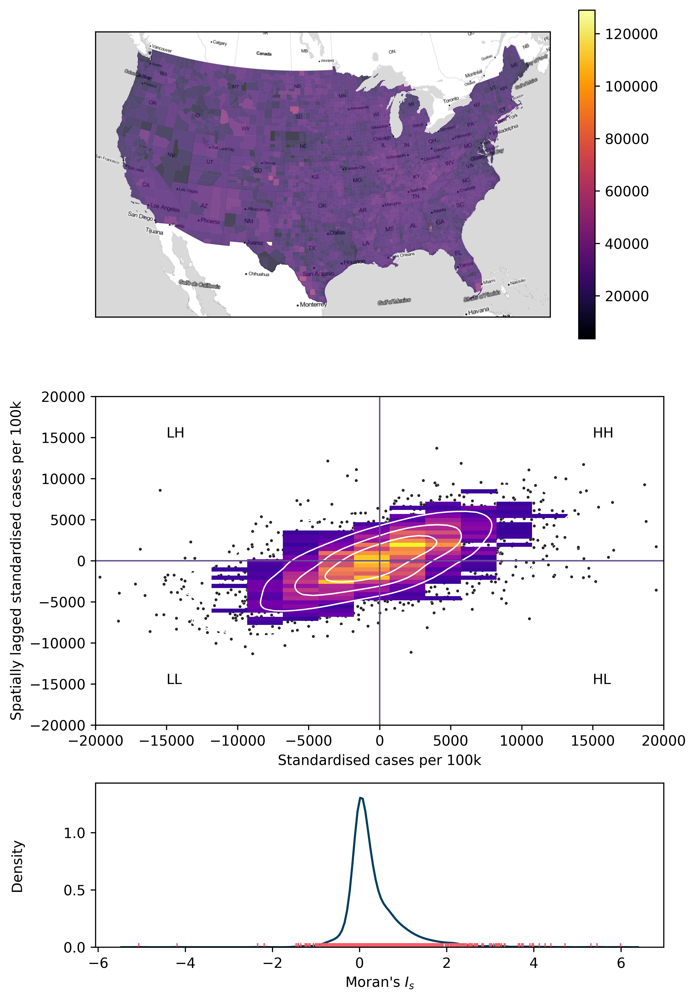

In [25]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(7, 10), gridspec_kw={"height_ratios": [2, 2, 1]}, dpi=OUTPUT_DPI)

gdf.plot(column="cases_per_100k", 
         cmap="inferno", 
         edgecolor="white", 
         linewidth=0, 
         alpha=0.75, 
         legend=True,
         ax=ax1)

contextily.add_basemap(ax1, crs=gdf.crs, source=BASEMAP, attribution=False)

ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)



sns.scatterplot(x=gdf.cases_per_100k_std, 
                y=gdf.w_cases_per_100k_std, 
                s=5, 
                color=".15",
                ax=ax2)
sns.histplot(x=gdf.cases_per_100k_std, 
             y=gdf.w_cases_per_100k_std, 
             bins=50, 
             pthresh=.1, 
             cmap="plasma",
             ax=ax2)
sns.kdeplot(x=gdf.cases_per_100k_std, 
            y=gdf.w_cases_per_100k_std, 
            levels=5, 
            color="w", 
            linewidths=1,
            ax=ax2)

ax2.set_xlim(-2e4, 2e4)
ax2.set_ylim(-2e4, 2e4)

ax2.hlines(xmax=2e4, xmin=-2e4, y=0, color=COLORS["X"], lw=1)
ax2.vlines(ymax=2e4, ymin=-2e4, x=0, color=COLORS["X"], lw=1)

ax2.annotate(text="LL", xy=(-1.5e4, -1.5e4))
ax2.annotate(text="LH", xy=(-1.5e4, 1.5e4))
ax2.annotate(text="HL", xy=(1.5e4, -1.5e4))
ax2.annotate(text="HH", xy=(1.5e4, 1.5e4))

ax2.set_ylabel("Spatially lagged standardised cases per 100k")
ax2.set_xlabel("Standardised cases per 100k")



sns.kdeplot(morans_i.Is, color=COLORS["D"], ax=ax3)
sns.rugplot(morans_i.Is, color=COLORS["I"], ax=ax3)
ax3.set_xlabel("Moran's $I_s$")

fig.subplots_adjust(left=0.2, wspace=0.6)
fig.align_ylabels([ax2, ax3])

plt.tight_layout()
plt.savefig("morans_distribution.pdf")

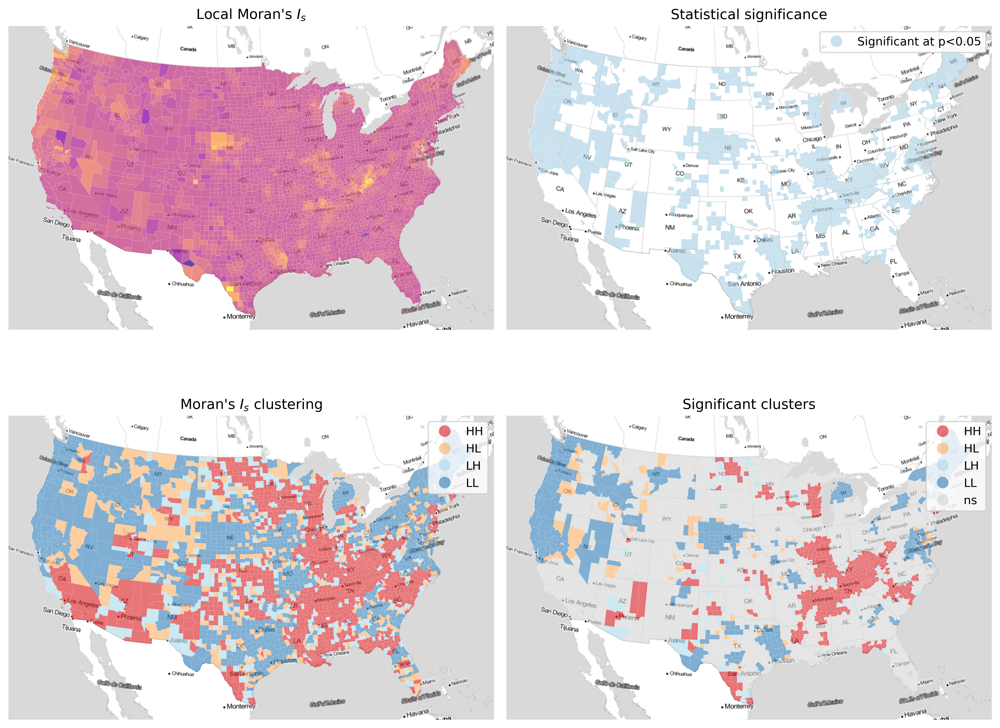

In [26]:
fig, axs = plt.subplots(ncols=2, nrows=2, figsize=(12, 10), dpi=400)
# Moran's I choropleth

ax1 = axs[0, 0]

gdf["morans_I"] = morans_i.Is

gdf.plot(column="morans_I", cmap="plasma", edgecolor="white", linewidth=0.1, alpha=0.75, ax=ax1)
ax1.title.set_text("Local Moran's $I_s$")

# Quadrant choropleth

# We're manually force-setting p to 1 here. Normally, `lisa_cluster()` would only show 
# statistically significant clusterings. For demonstration's sake, we want to see all
# clusterings, significant or not.
ax2 = axs[1, 0]

esdaplot.lisa_cluster(morans_i, gdf, p=1, alpha=0.6, ax=ax2)
ax2.title.set_text("Moran's $I_s$ clustering")


# Significance choropleth
ax3 = axs[0, 1]

gdf["significance_labels"] = pd.Series(1 * (morans_i.p_sim < 0.05), index=gdf.index).map({1: "Significant at p<0.05", 2: "Not significant"})

gdf.plot(column="significance_labels", categorical=True, k=2, cmap="Paired", linewidth=0.1, edgecolor="white", legend=True, alpha=0.6, ax=ax3)
ax3.title.set_text("Statistical significance")


# Significant quadrants choropleth

ax4 = axs[1, 1]

# This time we're setting the p-score cutoff to 0.05
esdaplot.lisa_cluster(morans_i, gdf, p=0.05, alpha=0.6, ax=ax4)
ax4.title.set_text("Significant clusters")


# Final configs
for i, ax in enumerate([ax1, ax2, ax3, ax4]):
    ax.set_axis_off()

    contextily.add_basemap(ax=ax, 
        crs=gdf.crs, 
        source=BASEMAP,
        attribution=False)


plt.tight_layout()

plt.savefig("morans_maps.pdf")